In [1]:
# Source https://learnopencv.com/human-pose-estimation-using-keypoint-rcnn-in-pytorch/#skeleton
import numpy as np
import cv2
import torch
from torchvision import transforms
from torchvision.models.detection import keypointrcnn_resnet50_fpn
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## 1. Загрузи предобученную сеть torchvision.models.detection.keypointrcnn_resnet50_fpn и подготовь её для инференса.

In [2]:
model = keypointrcnn_resnet50_fpn(weights='DEFAULT').eval().to(device)
# model.eval()

Downloading: "https://download.pytorch.org/models/keypointrcnn_resnet50_fpn_coco-fc266e95.pth" to /root/.cache/torch/hub/checkpoints/keypointrcnn_resnet50_fpn_coco-fc266e95.pth
100%|██████████| 226M/226M [00:13<00:00, 17.6MB/s]


## 2. Создай список опорных точек:

In [3]:
keypoints = [
    'nose','left_eye','right_eye',
    'left_ear','right_ear','left_shoulder',
    'right_shoulder','left_elbow','right_elbow',
    'left_wrist','right_wrist','left_hip',
    'right_hip','left_knee', 'right_knee',
    'left_ankle','right_ankle'
]

# coco_keypoints = [
#     "nose", "left_eye", "right_eye", "left_ear", "right_ear",
#     "left_shoulder", "right_shoulder", "left_elbow", "right_elbow",
#     "left_wrist", "right_wrist", "left_hip", "right_hip",
#     "left_knee", "right_knee", "left_ankle", "right_ankle",
# ]

## 3. Загрузи и примени трансформации transforms.Compose([T.ToTensor()]) к изображению бегущей девушки.

In [4]:
! gdown 1MfGx_GyPNgKcHz2W6BNdoidCYHUByZOG
! unzip images.zip

Downloading...
From: https://drive.google.com/uc?id=1MfGx_GyPNgKcHz2W6BNdoidCYHUByZOG
To: /content/images.zip
100% 2.65M/2.65M [00:00<00:00, 148MB/s]
Archive:  images.zip
  inflating: running_girl_ref.png    
  inflating: running_girl_test.jpg   
 extracting: running_girl_test.webp  
  inflating: running_girl_test2.jpg  
  inflating: running_girl_test3.jpg  
  inflating: running_girl_test4.jpg  
  inflating: running_girl_test5.jpg  
  inflating: running_girl_test6.jpg  


In [5]:
image_ref = cv2.imread('running_girl_ref.png')
image_ref = cv2.cvtColor(image_ref, cv2.COLOR_BGR2RGB)
transform = transforms.ToTensor()
image_ref_tensor = transform(image_ref).to(device)

In [6]:
image_test = cv2.imread('running_girl_test.jpg')
image_test = cv2.cvtColor(image_test, cv2.COLOR_BGR2RGB)
image_test_tensor = transform(image_test).to(device)

## 4. Прогони изображение через модель для получения ключевых точек.

In [7]:
with torch.no_grad():
    predictions_ref = model([image_ref_tensor])
    predictions_test = model([image_test_tensor])

## 5. Отрисуй ключевые точки с помощью функции draw_keypoints_per_person:

In [8]:
def draw_keypoints_per_person(
    img, all_keypoints, all_scores, confs, keypoint_threshold=2, conf_threshold=0.9
):
    # создаём спектр цветов
    cmap = plt.get_cmap("rainbow")
    # создаём копию изображений
    img_copy = img.copy()
    color_id = np.arange(1, 255, 255 // len(all_keypoints)).tolist()[::-1]
    # для каждого задетектированного человека
    for person_id in range(len(all_keypoints)):
        # проверяем степень уверенности детектора
        if confs[person_id] > conf_threshold:
            # собираем ключевые точки конкретного человека
            keypoints = all_keypoints[person_id, ...]
            # собираем скоры для ключевых точек
            scores = all_scores[person_id, ...]
            # итерируем по каждому скору
            for kp in range(len(scores)):
                # проверяем степень уверенности детектора опорной точки
                if scores[kp] > keypoint_threshold:
                    # конвертируем массив ключевых точек в список целых чисел
                    keypoint = tuple(
                        map(int, keypoints[kp, :2].detach().numpy().tolist())
                    )
                    # выбираем цвет
                    color = tuple(np.asarray(cmap(color_id[person_id])[:-1]) * 255)
                    # рисуем кружок радиуса 5 вокруг точки
                    cv2.circle(img_copy, keypoint, 5, color, -1)

    return img_copy

In [9]:
# boxes, labels, confs, all_keypoints, all_scores = [x.cpu() for x in predictions_ref[0].values()]
# image_with_kps = draw_keypoints_per_person(image_ref, all_keypoints, all_scores, confs)

# fig = plt.figure(figsize=(16, 10))
# plt.imshow(image_with_kps)
# plt.axis("off")

(-0.5, 799.5, 532.5, -0.5)

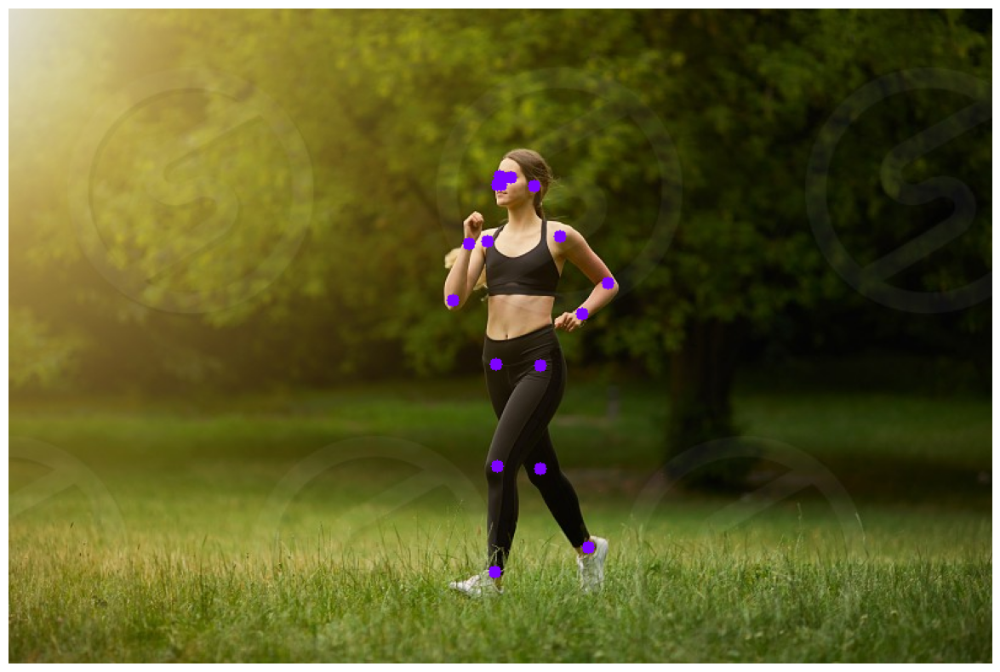

In [10]:
boxes, labels, confs, all_keypoints, all_scores = [x.cpu() for x in predictions_test[0].values()]
image_with_kps = draw_keypoints_per_person(image_test, all_keypoints, all_scores, confs)

fig = plt.figure(figsize=(16, 10))
plt.imshow(image_with_kps)
plt.axis("off")

## 6. Используя вспомогательную функцию, создай список «конечностей» девушки:

In [11]:
limbs = [
    [2, 0], [2, 4], [1, 0], [1, 3], [6, 8], [8, 10], [5, 7], [7, 9], [12, 14],
    [14, 16], [11, 13], [13, 15], [6, 5], [12, 11], [6, 12], [5, 11]
]

In [12]:
# import torchvision.transforms.functional as F
# # from torchvision.io import read_image
# # person_int = read_image("running_girl.png")

# def show(imgs):
#     if not isinstance(imgs, list):
#         imgs = [imgs]
#     fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
#     for i, img in enumerate(imgs):
#         img = img.detach()
#         img = F.to_pil_image(img)
#         axs[0, i].imshow(np.asarray(img))
#         axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

In [13]:
# from torchvision.utils import draw_keypoints

# # kpts = outputs[0]['keypoints']
# # scores = outputs[0]['scores']

# person_int = (image_tensor * 255).to(torch.uint8)
# kpts = all_keypoints
# scores = confs

# detect_threshold = 0.75
# idx = torch.where(scores > detect_threshold)
# keypoints = kpts[idx]

# connect_skeleton = [
#     (0, 1), (0, 2), (1, 3), (2, 4), (0, 5), (0, 6), (5, 7), (6, 8),
#     (7, 9), (8, 10), (5, 11), (6, 12), (11, 13), (12, 14), (13, 15), (14, 16)
# ]
# res = draw_keypoints(person_int, keypoints, connectivity=connect_skeleton, colors="red", radius=4, width=3)
# show(res)

## 7. Создай функцию для отрисовки каркаса (скелета) на базе уже имеющейся функции отрисовки ключевых точек.

In [14]:
def draw_structure_per_person(img, limbs, all_keypoints, all_scores, confs, keypoint_threshold=2, conf_threshold=0.9):

    # initialize a set of colors from the rainbow spectrum
    cmap = plt.get_cmap('rainbow')
    # create a copy of the image
    img_copy = img.copy()
    # check if the keypoints are detected
    if len(confs) > 0:
      # pick a set of N color-ids from the spectrum
      colors = np.arange(1, 255, 255//len(all_keypoints)).tolist()[::-1]
      # iterate for every person detected
      for person_id in range(len(confs)):
          # check the confidence score of the detected person
          if confs[person_id] > conf_threshold:
            # grab the keypoint-locations for the detected person
            keypoints = all_keypoints[person_id, ...]

            # iterate for every limb
            for limb_id in range(len(limbs)):
              # pick the start-point of the limb
              limb_loc1 = keypoints[limbs[limb_id][0], :2].numpy().astype(np.int32)  # .detach()
              # pick the start-point of the limb
              limb_loc2 = keypoints[limbs[limb_id][1], :2].numpy().astype(np.int32)  # .detach()
              # consider limb-confidence score as the minimum keypoint score among the two keypoint scores
              limb_score = min(all_scores[person_id, limbs[limb_id][0]], all_scores[person_id, limbs[limb_id][1]])
              # check if limb-score is greater than threshold
              if limb_score> keypoint_threshold:
                # pick the color at a specific color-id
                color = tuple(np.asarray(cmap(colors[person_id])[:-1])*255)
                # draw the line for the limb
                cv2.line(img_copy, tuple(limb_loc1), tuple(limb_loc2), color, 2)

    return img_copy

## 8. Отрисуй каркас на изображении.

(-0.5, 799.5, 532.5, -0.5)

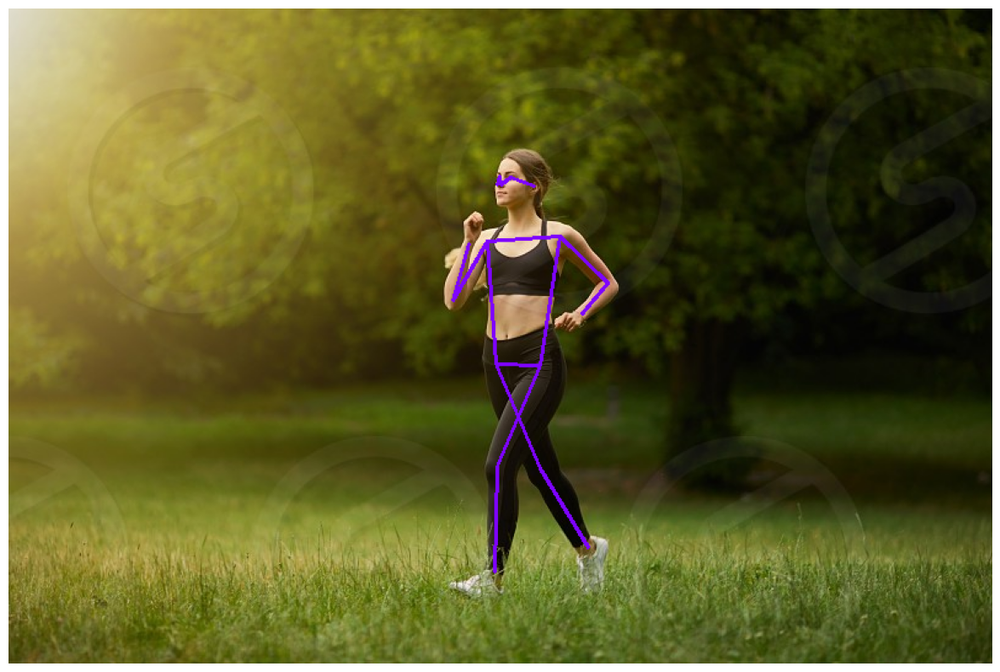

In [15]:
image_with_limbs = draw_structure_per_person(image_test, limbs, all_keypoints, all_scores, confs)

# cv2_imshow(image_with_limbs)
fig = plt.figure(figsize=(16, 10))
plt.imshow(image_with_limbs)
plt.axis("off")

In [33]:
from pathlib import Path

class Skeleton():
    """Keypoints inference and drawing for a single image
    """
    def __init__(self, img_name):
        """
        Args:
            img_name (str or Path): image name
        """

        # Check if file exists
        if Path(img_name).is_file():
            image = cv2.imread(str(img_name))
            self.image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        else:
            raise FileNotFoundError(
                errno.ENOENT, os.strerror(errno.ENOENT), Path(img_name))

        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        transform = transforms.ToTensor()
        self.img_tensor = transform(image).to(device)

        self.limbs = [
            [2, 0], [2, 4], [1, 0], [1, 3], [6, 8], [8, 10], [5, 7], [7, 9],
            [12, 14], [14, 16], [11, 13], [13, 15], [6, 5], [12, 11], [6, 12],
            [5, 11]]

    def inference(self, model):
        """KeypointRCNN_ResNet50_FPN inference

        Args:
            model: KeypointRCNN_ResNet50_FPN model

        Returns:
            numpy.ndarrays: boxes, labels, scores, keypoints, keypoints_scores
            as for PyTorch keypointrcnn_resnet50_fpn model
        """

        with torch.no_grad():
            predictions = model([self.img_tensor])

        # Model predictions to numpy arrays
        (self.boxes, self.labels, self.confs,
         self.all_keypoints, self.all_scores) = (
            [x.cpu().numpy() for x in predictions[0].values()])

        # # GPU memory cleanup
        # del model, img_tensor, predictions
        # torch.cuda.empty_cache()

        # return (self.boxes, self.labels, self.confs,
        #         self.all_keypoints, self.all_scores)

    def show(self, keypoint_threshold=2, conf_threshold=0.9):
        """Draw a skeleton on image

        Args:
            keypoint_threshold (int, optional): keypoint detection threshold.
                                                Defaults to 2.
            conf_threshold (float, optional): instance detection threshold.
                                                Defaults to 0.9.
        """
        # image to draw skeleton
        self.skeleton_img = self.image.copy()

        # color sequence
        cmap = plt.get_cmap('jet')
        # cmap = plt.get_cmap('rainbow')
        color_ids = (np.linspace(0, 255, len(self.confs) + 2)
                 .astype(int).tolist()[1:-1])
        # color_ids = np.arange(1, 255, 255 // len(self.all_keypoints)).tolist()[::-1]

        # # for each instance
        # for person_id, conf in enumerate(self.confs):
        #     if conf > conf_threshold:
        #         keypoints = self.all_keypoints[person_id, ...]
        #         scores = self.all_scores[person_id, ...]
        #         color = tuple(
        #             np.asarray(cmap(color_ids[person_id])[:-1]) * 255)

        #         # for each keepoint
        #         for kp_id, score in enumerate(scores):
        #             if score > keypoint_threshold:
        #                 keypoint = tuple(map(int, keypoints[kp_id, :2]))
        #                 cv2.circle(self.skeleton_img, keypoint, 5, color, -1)

        #         # for each limb
        #         for limb in self.limbs:
        #             kp1_id,  kp2_id = limb[0], limb[1]
        #             if (scores[kp1_id] > keypoint_threshold
        #                 and  scores[kp2_id] > keypoint_threshold
        #             ):
        #                 keypoint1 = tuple(map(int, keypoints[kp1_id, :2]))
        #                 keypoint2 = tuple(map(int, keypoints[kp2_id, :2]))
        #                 cv2.line(self.skeleton_img, keypoint1, keypoint2,
        #                          color, thickness=2)

        # for each instance
        for person_id in range(len(self.confs)):
            if self.confs[person_id] > conf_threshold:
                keypoints = self.all_keypoints[person_id, ...]
                scores = self.all_scores[person_id, ...]
                color = tuple(np.asarray(cmap(color_ids[person_id])[:-1]) * 255)

                # for each keepoint
                for kp_id in range(len(scores)):
                    if scores[kp_id] > keypoint_threshold:
                        keypoint = tuple(map(int, keypoints[kp_id, :2]))
                        cv2.circle(self.skeleton_img, keypoint, 5, color, -1)

                # for each limb
                for limb in self.limbs:
                    kp1_id,  kp2_id = limb[0], limb[1]
                    if (scores[kp1_id] > keypoint_threshold
                        and  scores[kp2_id] > keypoint_threshold
                    ):
                        keypoint1 = tuple(map(int, keypoints[kp1_id, :2]))
                        keypoint2 = tuple(map(int, keypoints[kp2_id, :2]))
                        cv2.line(self.skeleton_img, keypoint1, keypoint2,
                                 color, thickness=2)

        fig = plt.figure(figsize=(16, 10))
        plt.imshow(self.skeleton_img)
        plt.axis("off")

        # return

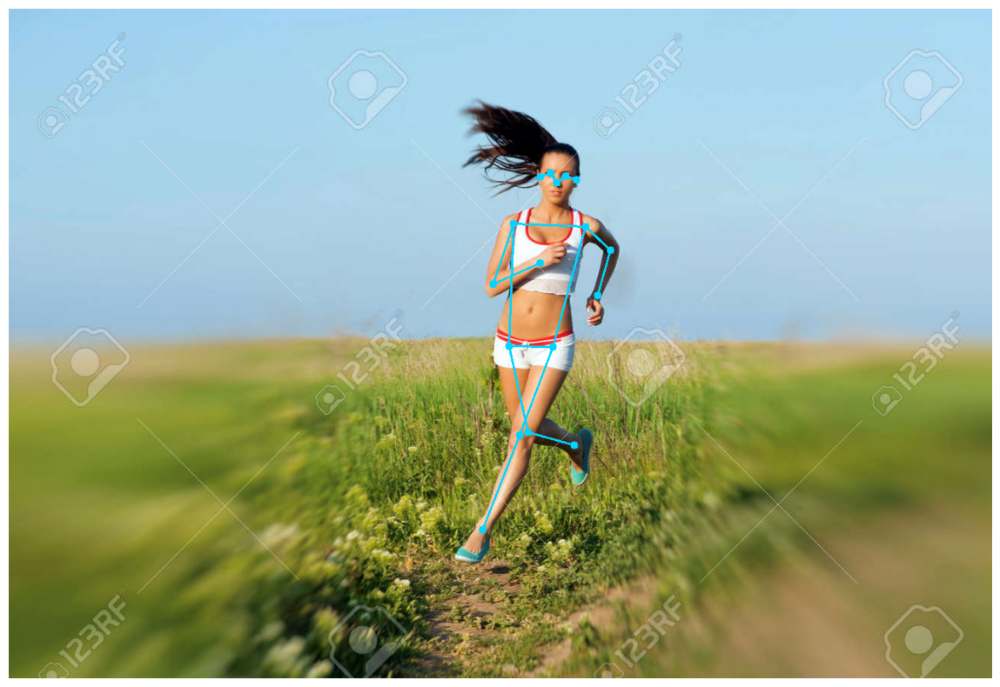

In [34]:
skeleton1 = Skeleton('running_girl_ref.png')
skeleton1.inference(model)
skeleton1.show()

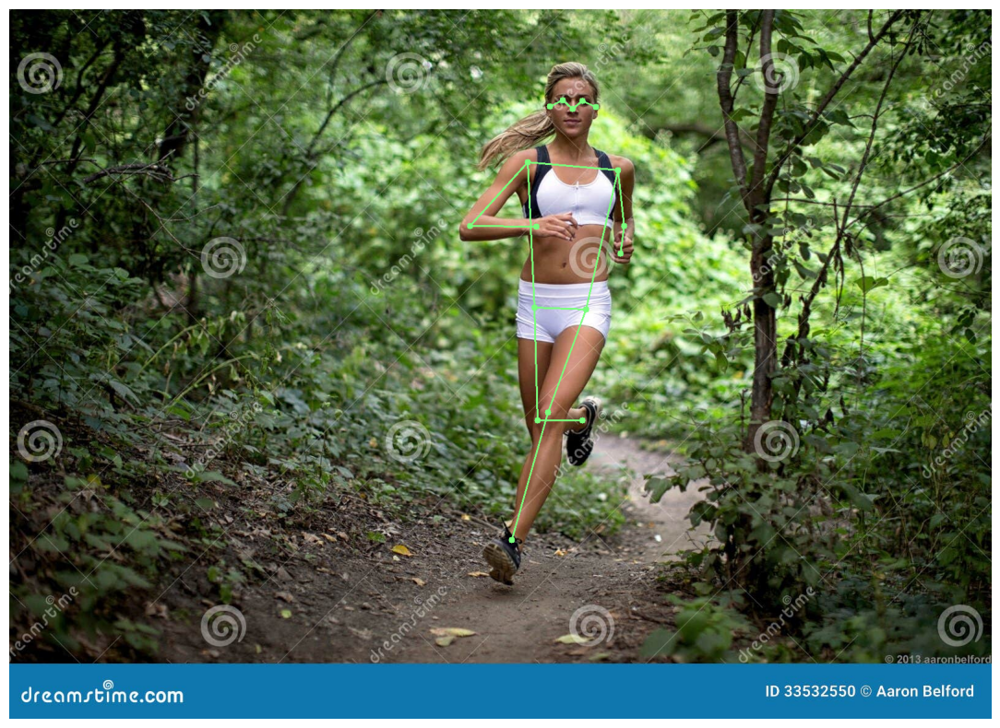

In [35]:
skeleton2 = Skeleton('running_girl_test5.jpg')
skeleton2.inference(model)
skeleton2.show()

In [44]:
# Keypoints of the instances with the greatest confidence: [0]
keypoints_reference = skeleton1.all_keypoints[0][:, :2]
keypoints_test = skeleton2.all_keypoints[0][:, :2]

# X*A + b = Y  ->  X * A = Y
pad = lambda x: np.hstack([x, np.ones((x.shape[0], 1))])
unpad = lambda x: x[:, :-1]

# Negative keypoint scores to zero
skeleton1.all_scores[skeleton1.all_scores < 0] = 0
skeleton2.all_scores[skeleton2.all_scores < 0] = 0

# With keypoint weights
W = np.sqrt(np.diag(skeleton1.all_scores[0] * skeleton2.all_scores[0]))
X = W @ pad(keypoints_test)
Y = W @ pad(keypoints_reference)

# Without keypoint weights
# Y = pad(keypoints_reference)
# X = pad(keypoints_test)

# Least squares for X * A = Y
# A is the affine transformation
A, res, rank, s = np.linalg.lstsq(X, Y, rcond=None)
A[np.abs(A) < 1e-10] = 0  # low values to zero

# Best fit of the test to the coach
transform = lambda x: unpad(pad(x) @ A)
keypoints_transformed = transform(keypoints_test)

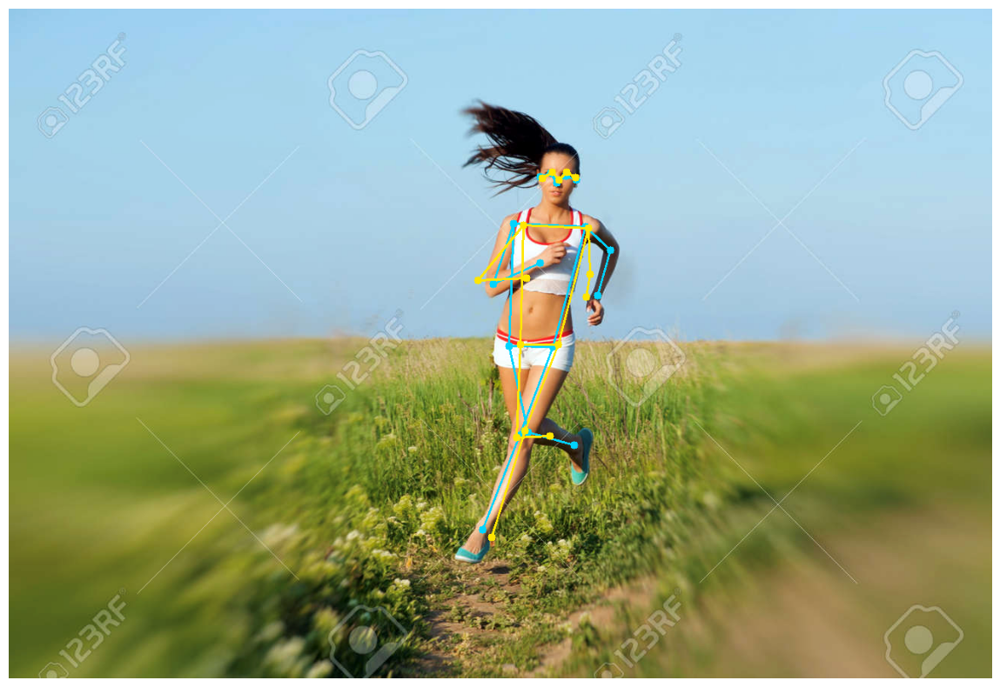

In [45]:
# Skeleton2 best fitted to the reference image
skeleton1.all_keypoints[1] = pad(keypoints_transformed)
skeleton1.all_scores[1] = skeleton2.all_scores[0]
skeleton1.confs[1] = 1

skeleton1.show()

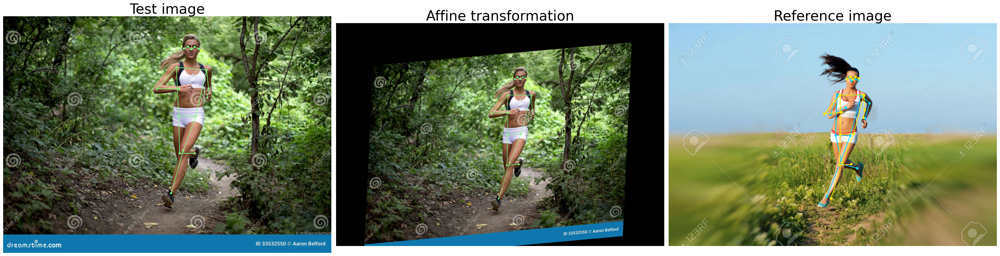

In [41]:
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

"""Affine transformation of the test image"""
# Tranformed image size
rows, cols = skeleton1.skeleton_img.shape[:2]

# Apply the affine transformation
img_transformed = cv2.warpAffine(
    skeleton2.skeleton_img, A[:,:2].T, (cols,rows))

# Display the images
fig, ax = plt.subplots(1, 3, figsize=(32, 10))
ax[0].imshow(skeleton2.skeleton_img)
ax[1].imshow(img_transformed)
ax[2].imshow(skeleton1.skeleton_img)
ax[0].set_title('Test image', fontsize=32)
ax[1].set_title('Affine transformation', fontsize=32)
ax[2].set_title('Reference image', fontsize=32)
ax[0].axis("off")
ax[1].axis("off")
ax[2].axis("off")
plt.tight_layout()

In [46]:
center_array = lambda x, ax: x-x.mean(axis=ax)

# From training
def cosine_distance(pose1, pose2):
    cossim = pose1.dot(np.transpose(pose2)) / (
        np.linalg.norm(pose1) * np.linalg.norm(pose2)
    )
    dist = cossim
    return dist

# def cosine_similarity(pose1, pose2):
#     """pose1, pose2 are [17, 2] keypoint arrays"""
#     # Centering
#     pose1 = center_array(pose1, 0)
#     pose2 = center_array(pose2, 0)
#     pose1, pose2 = pose1.flatten(), pose2.flatten()
#     return pose1@pose2.T / (np.linalg.norm(pose1)*np.linalg.norm(pose2))

# From training
def weight_distance(pose1, pose2, conf1):
    # D(U,V) = (1 / sum(conf1)) * sum(conf1 * ||pose1 - pose2||) = sum1 * sum2

    sum1 = 1 / np.sum(conf1)
    sum2 = 0

    for i in range(len(pose1)):
        # каждый индекс i имеет x и y, у которых одинаковая оценка достоверности
        conf_ind = math.floor(i / 2)
        sum2 = conf1[conf_ind] * abs(pose1[i] - pose2[i])

    weighted_dist = sum1 * sum2

    return weighted_dist

# def weighted_distance(pose1, pose2, keypoint_confs):
#     """pose1, pose2 are [17, 2] keypoint arrays
#        keypoint_confs are keypoint confidences (17-vector)"""

#     # Centering
#     pose1 = center_array(pose1, 0)
#     pose2 = center_array(pose2, 0)

#     # Normalization
#     pose1, pose2 = pose1 / np.linalg.norm(pose1), pose2 / np.linalg.norm(pose2)

#     # Summation of weighted distances between keypoints
#     sum = 0
#     for k in range(len(pose1)):
#         sum += keypoint_confs[k] * np.linalg.norm(pose1[k]-pose2[k])

#     return sum / keypoint_confs.sum()

In [47]:
print(f'Cosine similarity:\
      {cosine_similarity(keypoints_transformed, keypoints_reference):.4f}')

mutual_confs = np.sqrt(skeleton1.all_scores[0] * skeleton2.all_scores[0])
print(f'Weighted distance:\
      {weighted_distance(keypoints_transformed, keypoints_reference, mutual_confs):.4f}')

Cosine similarity:      0.9934
Weighted distance:      0.0223
